In [4]:
import scanpy as sc
import squidpy as sq
from squidpy.im import ImageContainer
import numpy as np
import pandas as pd
from anndata import AnnData
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import skimage
import seaborn as sns
import tangram as tg
import torch

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")

%load_ext autoreload
%autoreload 2
%matplotlib inline

scanpy==1.10.3 anndata==0.10.9 umap==0.5.9.post2 numpy==1.26.4 scipy==1.13.1 pandas==2.3.1 scikit-learn==1.6.1 statsmodels==0.14.5 igraph==0.11.9 pynndescent==0.5.13
squidpy==1.6.1
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
adata_sc = sc.read_h5ad('/Users/rikac/Documents/mansfield_lab/summer_25/bc3306_final_adata.h5ad')
adata_st = sc.read_h5ad('/Users/rikac/Documents/mansfield_lab/summer_25/sample_cosmx.h5ad')

In [5]:
adata_sc

AnnData object with n_obs × n_vars = 23299 × 18973
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'doublet_scores', 'predicted_doublets', 'batch', 'leiden_0.01', 'leiden_0.025', 'leiden_0.05', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2', 'leiden_0.4', 'ebf2+_sox9+_col2a1+', 'ebf2+_sox9+_col2a1-'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'DGEleiden0.01', 'DGEleiden0.025', 'DGEleiden0.05', 'DGEleiden0.1', 'DGEleiden0.15', 'DGEleiden0.2', 'DGEleiden0.4', 'ebf2+_sox9+_col2a1+_colors', 'ebf2+_sox9+_col2a1-_colors', 'hvg', 'leiden_0.01', 'leiden_0.01_colors', 'leiden_0.025', 'leiden_0.025_colors', 'leiden_0.05', 'leiden_0.05_

In [6]:
adata_st

AnnData object with n_obs × n_vars = 60268 × 980
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Negative', 'log1p_total_counts_Negative', 'pct_counts_Negative', 'total_counts_SystemControl', 'log1p_total_counts_SystemControl', 'pct_counts_SystemControl', 'n_counts', 'leiden_0.5'
    var: 'Negative', 'SystemControl', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'leiden_0.5', 'leiden_0.5_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 's

In [7]:
# downsample cells in adata_st for computation cost
sc.pp.subsample(adata_st, n_obs=30000, random_state=42)

In [8]:
# training genes
sc.tl.rank_genes_groups(adata_sc, groupby="leiden_0.4", use_raw=False)
markers_df = pd.DataFrame(adata_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))
len(markers)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


1650

In [9]:
tg.pp_adatas(adata_sc, adata_st, genes=markers)

INFO:root:175 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:748 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [10]:
#device = "mps" if torch.backends.mps.is_available() else "cpu"

ad_map = tg.map_cells_to_space(adata_sc, adata_st,
    mode="cells",
    # mode="clusters",
    # cluster_label='cell_subclass',  # .obs field w cell types
    density_prior='rna_count_based',
    num_epochs=500,
    device='cpu'
)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 175 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.419, KL reg: 0.012
Score: 0.707, KL reg: 0.002
Score: 0.743, KL reg: 0.001
Score: 0.751, KL reg: 0.000
Score: 0.754, KL reg: 0.000


INFO:root:Saving results..


In [11]:
ad_map.write_h5ad('/Users/rikac/Documents/mansfield_lab/summer_25/ad_map_cosmx.h5ad')

In [12]:
ad_map

AnnData object with n_obs × n_vars = 23299 × 30000
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'doublet_scores', 'predicted_doublets', 'batch', 'leiden_0.01', 'leiden_0.025', 'leiden_0.05', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2', 'leiden_0.4', 'ebf2+_sox9+_col2a1+', 'ebf2+_sox9+_col2a1-'
    var: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Negative', 'log1p_total_counts_Negative', '

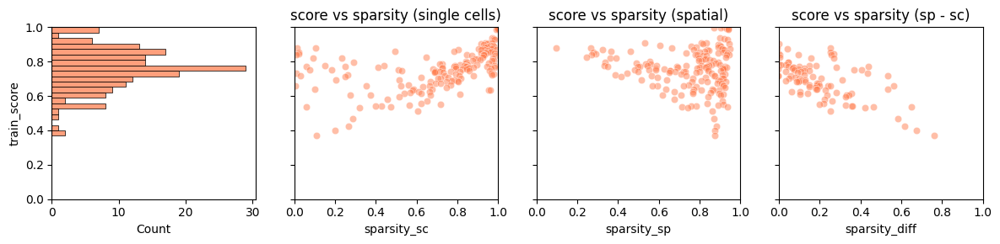

In [14]:
# cell type maps
tg.plot_training_scores(ad_map, bins=20, alpha=.5)

In [15]:
ad_ge = tg.project_genes(adata_map=ad_map, adata_sc=adata_sc)
ad_ge

AnnData object with n_obs × n_vars = 30000 × 18973
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Negative', 'log1p_total_counts_Negative', 'pct_counts_Negative', 'total_counts_SystemControl', 'log1p_total_counts_SystemControl', 'pct_counts_SystemControl', 'n_counts', 'leiden_0.5', 'uniform_density', 'rna_count_based_density'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'sparsity', 'is_tr

In [21]:
ad_ge

AnnData object with n_obs × n_vars = 30000 × 18973
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Negative', 'log1p_total_counts_Negative', 'pct_counts_Negative', 'total_counts_SystemControl', 'log1p_total_counts_SystemControl', 'pct_counts_SystemControl', 'n_counts', 'leiden_0.5', 'uniform_density', 'rna_count_based_density', 'sox9 (predicted)', 'ebf2 (predicted)', 'cxcl12 (predicted)', 'hoxa5 (predicted)'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_varia

In [20]:
adata_st.obsm["spatial"] = np.stack([
    adata_st.obs["CenterX_global_px"].values,
    adata_st.obs["CenterY_global_px"].values
], axis=1)

ad_ge.obsm["spatial"] = adata_st.obsm["spatial"].copy()

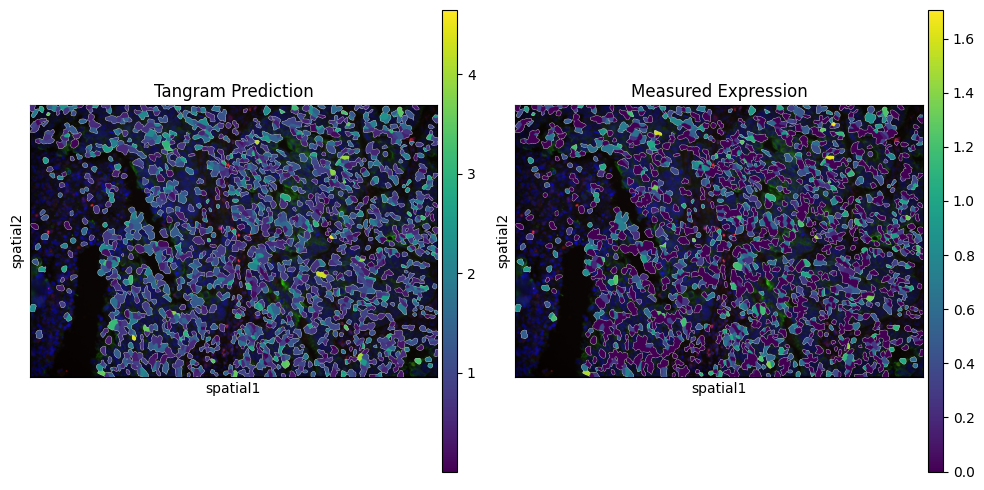

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

sq.pl.spatial_segment(
    ad_ge,
    color="sox9",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="20",
    img=True,
    size=60,
    ax=axs[0],
)
axs[0].set_title("Tangram Prediction")


# Plot measured gene expression
sq.pl.spatial_segment(
    adata_st,
    color="sox9",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="20",
    img=True,
    size=60,
    ax=axs[1],
)
axs[1].set_title("Measured Expression")

plt.tight_layout()
plt.show()

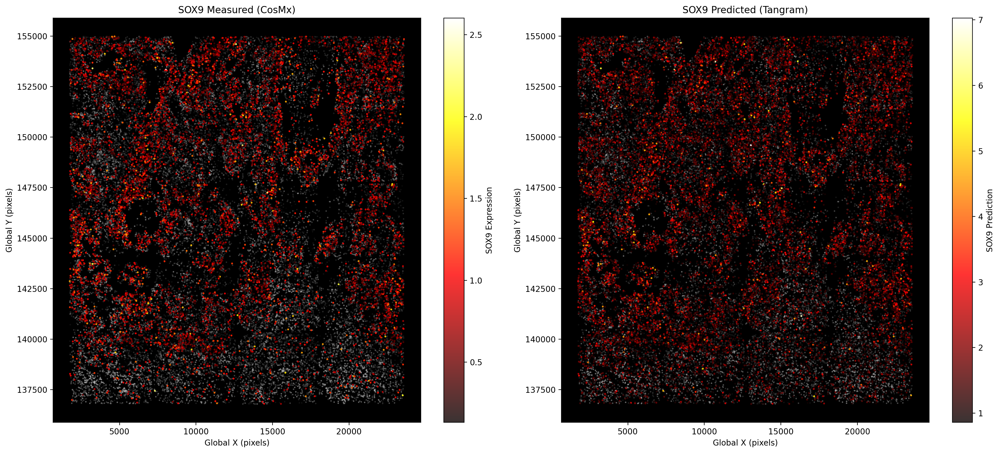

In [44]:
# stitched FOV plot - gene expression on cosmx data

fig, axs = plt.subplots(1, 2, figsize=(18,8), dpi=200)

### Left panel: actual CosMx data
global_coords = adata_st.obs[['CenterX_global_px', 'CenterY_global_px']].values
dapi_values = adata_st.obs['Mean.DAPI']

# Background DAPI
axs[0].scatter(global_coords[:, 0], global_coords[:, 1],
               c=dapi_values, s=1.0, alpha=0.3,
               cmap='gray',
               vmin=0, vmax=np.percentile(dapi_values, 95))

# Overlay SOX9 expression
gene_expression = adata_st[:, 'sox9'].X
if hasattr(gene_expression, 'toarray'):
    gene_expression = gene_expression.toarray().flatten()

threshold = np.percentile(gene_expression, 50)
mask = gene_expression > threshold

scatter1 = axs[0].scatter(global_coords[mask, 0], global_coords[mask, 1],
                          c=gene_expression[mask],
                          s=2.0, alpha=0.8, cmap='hot')

axs[0].set_title('SOX9 Measured (CosMx)')
axs[0].set_xlabel('Global X (pixels)')
axs[0].set_ylabel('Global Y (pixels)')
axs[0].set_facecolor('black')
fig.colorbar(scatter1, ax=axs[0], label='SOX9 Expression')

### Right panel: Tangram prediction
global_coords_pred = ad_ge.obs[['CenterX_global_px', 'CenterY_global_px']].values
dapi_pred = ad_ge.obs['Mean.DAPI']

axs[1].scatter(global_coords_pred[:, 0], global_coords_pred[:, 1],
               c=dapi_pred, s=1.0, alpha=0.3,
               cmap='gray',
               vmin=0, vmax=np.percentile(dapi_pred, 95))

# Overlay predicted SOX9
gene_expression_pred = ad_ge[:, 'sox9'].X
if hasattr(gene_expression_pred, 'toarray'):
    gene_expression_pred = gene_expression_pred.toarray().flatten()

threshold_pred = np.percentile(gene_expression_pred, 50)
mask_pred = gene_expression_pred > threshold_pred

scatter2 = axs[1].scatter(global_coords_pred[mask_pred, 0], global_coords_pred[mask_pred, 1],
                          c=gene_expression_pred[mask_pred],
                          s=2.0, alpha=0.8, cmap='hot')

axs[1].set_title('SOX9 Predicted (Tangram)')
axs[1].set_xlabel('Global X (pixels)')
axs[1].set_ylabel('Global Y (pixels)')
axs[1].set_facecolor('black')
fig.colorbar(scatter2, ax=axs[1], label='SOX9 Prediction')

plt.tight_layout()
plt.show()

In [45]:
# calculate expression to get the same spectrum of colorbar
# Compute gene expression arrays
expr_measured = adata_st[:, 'sox9'].X
expr_predicted = ad_ge[:, 'sox9'].X

# If sparse, convert to dense
if hasattr(expr_measured, 'toarray'):
    expr_measured = expr_measured.toarray().flatten()
if hasattr(expr_predicted, 'toarray'):
    expr_predicted = expr_predicted.toarray().flatten()

# Compute shared color scale limits (you can choose percentile or min/max)
vmin = min(np.percentile(expr_measured, 5), np.percentile(expr_predicted, 5))
vmax = max(np.percentile(expr_measured, 99), np.percentile(expr_predicted, 99))

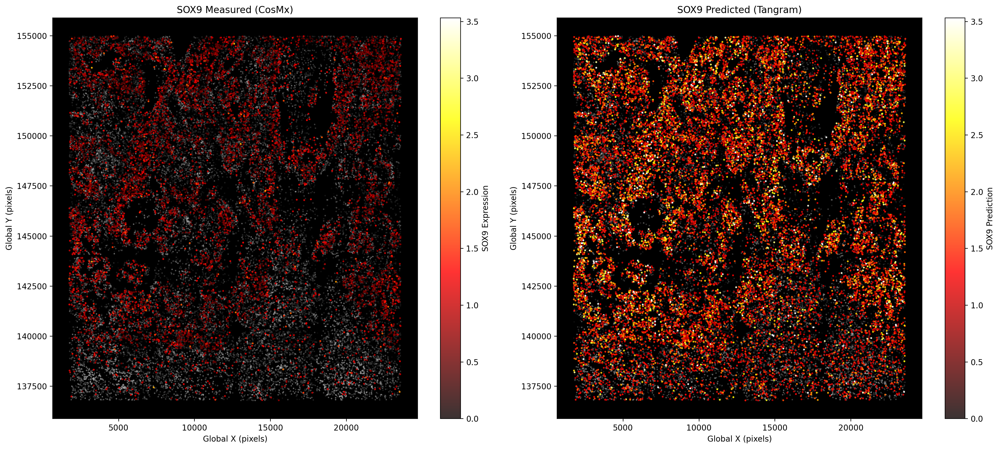

In [46]:
# stitched FOV plot - gene expression on cosmx data

fig, axs = plt.subplots(1, 2, figsize=(18,8), dpi=200)

### Left panel: actual CosMx data
global_coords = adata_st.obs[['CenterX_global_px', 'CenterY_global_px']].values
dapi_values = adata_st.obs['Mean.DAPI']

# Background DAPI
axs[0].scatter(global_coords[:, 0], global_coords[:, 1],
               c=dapi_values, s=1.0, alpha=0.3,
               cmap='gray',
               vmin=0, vmax=np.percentile(dapi_values, 95))

# Overlay SOX9 expression
gene_expression = adata_st[:, 'sox9'].X
if hasattr(gene_expression, 'toarray'):
    gene_expression = gene_expression.toarray().flatten()

threshold = np.percentile(gene_expression, 50)
mask = gene_expression > threshold

scatter1 = axs[0].scatter(global_coords[mask, 0], global_coords[mask, 1],
                          c=gene_expression[mask],
                          s=2.0, alpha=0.8, cmap='hot', vmin=vmin, vmax=vmax)

axs[0].set_title('SOX9 Measured (CosMx)')
axs[0].set_xlabel('Global X (pixels)')
axs[0].set_ylabel('Global Y (pixels)')
axs[0].set_facecolor('black')
fig.colorbar(scatter1, ax=axs[0], label='SOX9 Expression')

### Right panel: Tangram prediction
global_coords_pred = ad_ge.obs[['CenterX_global_px', 'CenterY_global_px']].values
dapi_pred = ad_ge.obs['Mean.DAPI']

axs[1].scatter(global_coords_pred[:, 0], global_coords_pred[:, 1],
               c=dapi_pred, s=1.0, alpha=0.3,
               cmap='gray',
               vmin=0, vmax=np.percentile(dapi_pred, 95))

# Overlay predicted SOX9
gene_expression_pred = ad_ge[:, 'sox9'].X
if hasattr(gene_expression_pred, 'toarray'):
    gene_expression_pred = gene_expression_pred.toarray().flatten()

threshold_pred = np.percentile(gene_expression_pred, 50)
mask_pred = gene_expression_pred > threshold_pred

scatter2 = axs[1].scatter(global_coords_pred[mask_pred, 0], global_coords_pred[mask_pred, 1],
                          c=gene_expression_pred[mask_pred],
                          s=2.0, alpha=0.8, cmap='hot', vmin=vmin, vmax=vmax)

axs[1].set_title('SOX9 Predicted (Tangram)')
axs[1].set_xlabel('Global X (pixels)')
axs[1].set_ylabel('Global Y (pixels)')
axs[1].set_facecolor('black')
fig.colorbar(scatter2, ax=axs[1], label='SOX9 Prediction')

plt.tight_layout()
plt.show()

In [47]:
# auc curve
df_all_genes = tg.compare_spatial_geneexp(ad_ge, adata_st, adata_sc)
df_all_genes

,score,is_training,sparsity_sp,sparsity_sc,sparsity_diff
g6pc2,0.999406,True,0.939933,0.999013,-0.059079
ccr10,0.999288,True,0.918600,0.998970,-0.080370
nanog,0.999094,True,0.904600,0.998712,-0.094112
gpnmb,0.994473,True,0.868300,0.997983,-0.129683
fgg,0.992420,True,0.933500,0.998712,-0.065212
...,...,...,...,...,...
tnfsf18,0.023275,False,0.944600,0.999142,-0.054542
ffar4,0.021349,False,0.925700,0.998841,-0.073141
ppbp,0.016614,False,0.947500,0.997296,-0.049796
angpt4,0.016262,False,0.960867,0.998240,-0.037374


<Figure size 640x480 with 0 Axes>

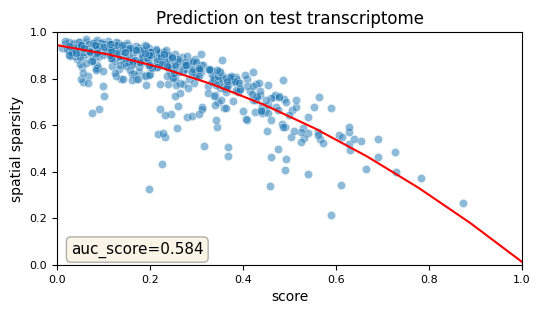

In [48]:
tg.plot_auc(df_all_genes)

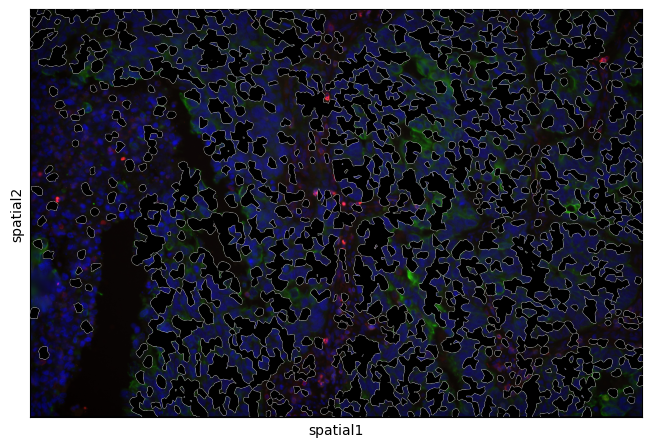

In [49]:
sq.pl.spatial_segment(
    adata_st,
    # color="",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="20",
    img=True,
    size=60,
)

In [50]:
adata = sc.read('/Users/rikac/Downloads/exported_results.h5ad')

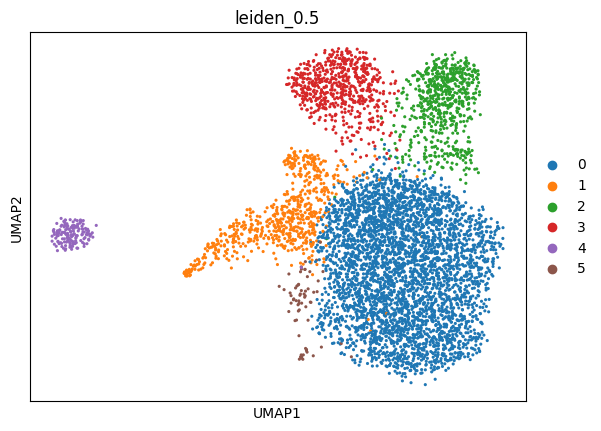

In [52]:
sc.pl.umap(adata, color='leiden_0.5')